In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_038_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_017_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_025_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_073_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_BIRD_007_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_012_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_AIRPLANE_041_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_033_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_BIRD_001_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_051_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_069_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_043_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_074_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_008_LABELS.csv
/kaggle/input

In [2]:
%rm -r /kaggle/working/Training_Dataset_Images
%rm -r /kaggle/working/CSV


rm: cannot remove '/kaggle/working/Training_Dataset_Images': No such file or directory
rm: cannot remove '/kaggle/working/CSV': No such file or directory


In [3]:
%pip install --upgrade imutils

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25861 sha256=7538bf6739212708297dbe9a475ae902fa3378c0686200064b1799861dd054f2
  Stored in directory: /root/.cache/pip/wheels/35/e4/69/cb99d996d14a2971b79b990d68b05a17d58ce530ff96090dfc
Successfully built imutils
Note: you may need to restart the kernel to use updated packages.


In [4]:
# read the CSV file for each video and store the bounding box coordinates in a list of dictionaries
def read_csv_file(csv_file):
    data = []
    with open(csv_file, 'r') as f:
        reader = csv.reader(f)
        next(reader) # skip header row
        for row in reader:
            time = float(row[0].strip("'").split(" ")[0])
            try:
                bboxes = {}
                if row[1]:
                    if row[1]!='[]':
                        lst=row[1].strip("],[").split(";")
                        lst=[i.split(",") for i in lst]
                        for i in lst:
                            for j in range(4):
                                if i[j].isnumeric():
                                    i[j]=float(i[j])
                        bboxes['Airplane'] =lst
                    else:
                        bboxes['Airplane']=[]
                        
                if row[2]:
                    if row[2]!='[]':
                        lst=row[2].strip("],[").split(";")
                        lst=[i.split(",") for i in lst]
                        for i in lst:
                            for j in range(4):
                                if i[j].isnumeric():
                                    i[j]=float(i[j])
                                    
                        bboxes['Bird/Birds'] =lst
                    else:
                        bboxes['Bird/Birds']=[]
                        
                        
                if row[3]:
                    if row[3]!='[]':
                        lst=row[3].strip("],[").split(";")
                        lst=[i.split(",") for i in lst]
                        for i in lst:
                            for j in range(4):
                                if i[j].isnumeric():
                                    i[j]=float(i[j])

                        bboxes['Drone/Drones'] =lst
                    else:
                         bboxes['Drone/Drones']=[]

                if row[4]:
                    if row[4]!='[]':
                        lst=row[4].strip("],[").split(";")
                        lst=[i.split(",") for i in lst]
                        for i in lst:
                            for j in range(4):
                                if i[j].isnumeric():
                                    i[j]=float(i[j])

                        bboxes['Helicopter'] =lst
                    else:
                        bboxes['Helicopter']=[]
            
                    data.append({'time': time, 'bboxes': bboxes})
                
            except Exception:
                    continue
        
    return data

In [5]:
import cv2
import os
import csv
import re

# set the path to the directory containing the videos and CSV files
video_dir = "/kaggle/input/samplepesu/Training Dataset_Videos"
csv_dir ="/kaggle/input/samplepesu/Training Dataset_csv"

frames_dir = "/kaggle/working/Training_Dataset_Images"
op_CSV_dir = "/kaggle/working/CSV"

if not os.path.exists(frames_dir):
            os.makedirs(frames_dir)
if not os.path.exists(op_CSV_dir):
            os.makedirs(op_CSV_dir)

for video_file in os.listdir(video_dir):
    op_CSV =video_file.split("_")[1] + ".csv" 
    op_CSV=os.path.join(op_CSV_dir, op_CSV)
    row=["Image File"]+["label"]+["x_min"]+["y_min"]+["width"]+["height"]
    with open(op_CSV, 'a') as f:
        if os.path.getsize(op_CSV) == 0:
            writer = csv.writer(f)
            writer.writerow(row)

class_balance={"AIRPLANE":0, "DRONE":0, "BIRD":0, "HELICOPTER":0}

for video_file in os.listdir(video_dir):
    

    if video_file.split("_")[1] in class_balance:
        if class_balance[video_file.split("_")[1]]==50:
            continue
        else:
            class_balance[video_file.split("_")[1]]+=1
        
    
    if len(list(set(list(class_balance.values())))) == 1:
        break
    
    if video_file.endswith('.mp4'):
        print(f"Processing video file {video_file}...")
        
        # read the CSV file for the current video
        csv_file = os.path.join(csv_dir, video_file.replace('.mp4', '_LABELS.csv'))
        data = read_csv_file(csv_file)
        
        # read the video file and extract each frame
        cap = cv2.VideoCapture(os.path.join(video_dir, video_file))
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        
        for i in range(0,frame_count,6):
            # extract the current frame
            cap.set(cv2.CAP_PROP_POS_FRAMES, i)
            ret, frame = cap.read()
            if not ret:
                continue
            
            # save the frame as an image
            op_file = f"{os.path.splitext(video_file)[0]}_{i}.jpg"
            if not os.path.exists(frames_dir+"/"+video_file.split("_")[1]):
                os.makedirs(frames_dir+"/"+video_file.split("_")[1])
            
            cv2.imwrite(os.path.join(frames_dir+"/"+video_file.split("_")[1], op_file), frame)
            
            # write the bounding box coordinates to a new CSV file for the current frame
            time = i * 0.033334 # each frame is 0.033334 seconds long
            frame_data = next((d for d in data if d['time'] >= time), None)
            #frame_data['bboxes']['Image_name']=frame_file
            
            
            if frame_data: 
                op_CSV = video_file.split("_")[1] + ".csv"
                with open(os.path.join(op_CSV_dir, op_CSV), 'a') as f:
                    writer = csv.writer(f)
                    for label, bboxes in frame_data['bboxes'].items():
                        if bboxes==[]:
                            row=[op_file]+[video_file.split("_")[1]]+[]
                        else:
                            for bbox in bboxes:
                                row = [op_file]+[video_file.split("_")[1]] + bbox
                        writer.writerow(row)

Processing video file V_DRONE_022.mp4...
Processing video file V_DRONE_011.mp4...
Processing video file V_DRONE_023.mp4...
Processing video file V_BIRD_034.mp4...
Processing video file V_HELICOPTER_041.mp4...
Processing video file V_DRONE_046.mp4...
Processing video file V_DRONE_063.mp4...
Processing video file V_HELICOPTER_050.mp4...
Processing video file V_BIRD_029.mp4...
Processing video file V_HELICOPTER_014.mp4...
Processing video file V_AIRPLANE_044.mp4...
Processing video file V_HELICOPTER_035.mp4...
Processing video file V_HELICOPTER_009.mp4...
Processing video file V_DRONE_024.mp4...
Processing video file V_DRONE_060.mp4...
Processing video file V_BIRD_037.mp4...
Processing video file V_AIRPLANE_039.mp4...
Processing video file V_HELICOPTER_056.mp4...
Processing video file V_HELICOPTER_052.mp4...
Processing video file V_HELICOPTER_004.mp4...
Processing video file V_HELICOPTER_013.mp4...
Processing video file V_AIRPLANE_050.mp4...
Processing video file V_AIRPLANE_014.mp4...
Pro

In [6]:
airplane= pd.read_csv("/kaggle/working/CSV/AIRPLANE.csv")
bird= pd.read_csv("/kaggle/working/CSV/BIRD.csv")
drone= pd.read_csv("/kaggle/working/CSV/DRONE.csv")
helicopter= pd.read_csv("/kaggle/working/CSV/HELICOPTER.csv")

print(airplane.head())
print(bird.head())
print(drone.head())
print(helicopter.head())

             Image File     label       x_min       y_min      width  \
0  V_AIRPLANE_044_0.jpg  AIRPLANE  327.588379  250.744568  56.928436   
1  V_AIRPLANE_044_0.jpg  AIRPLANE         NaN         NaN        NaN   
2  V_AIRPLANE_044_0.jpg  AIRPLANE         NaN         NaN        NaN   
3  V_AIRPLANE_044_0.jpg  AIRPLANE         NaN         NaN        NaN   
4  V_AIRPLANE_044_6.jpg  AIRPLANE  332.739594  253.072937  63.225616   

      height  
0  48.843201  
1        NaN  
2        NaN  
3        NaN  
4  54.767456  
         Image File label  x_min       y_min  width     height
0  V_BIRD_034_0.jpg  BIRD    NaN         NaN    NaN        NaN
1  V_BIRD_034_0.jpg  BIRD  265.5  224.750001   26.5  22.749999
2  V_BIRD_034_0.jpg  BIRD    NaN         NaN    NaN        NaN
3  V_BIRD_034_0.jpg  BIRD    NaN         NaN    NaN        NaN
4  V_BIRD_034_6.jpg  BIRD    NaN         NaN    NaN        NaN
          Image File  label       x_min     y_min      width     height
0  V_DRONE_022_0.jpg  DRONE

In [7]:
print(airplane.shape,
bird.shape,
helicopter.shape,
drone.shape)


list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/DRONE")
print(len(list_of_files))
list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/AIRPLANE")
print(len(list_of_files))
list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/HELICOPTER")
print(len(list_of_files))
list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/BIRD")
print(len(list_of_files))

(10536, 6) (10324, 6) (10456, 6) (10400, 6)
2608
2642
2618
2597


In [8]:
print(airplane.isna().sum())
print(drone.isna().sum())
print(helicopter.isna().sum())
print(bird.isna().sum())

airplane=airplane.dropna()
drone=drone.dropna()
helicopter=helicopter.dropna()
bird=bird.dropna()

print(airplane.isna().sum())
print(drone.isna().sum())
print(helicopter.isna().sum())
print(bird.isna().sum())



Image File       0
label            0
x_min         7902
y_min         7902
width         7902
height        7902
dtype: int64
Image File       0
label            0
x_min         7800
y_min         7800
width         7800
height        7800
dtype: int64
Image File       0
label            0
x_min         7842
y_min         7842
width         7842
height        7842
dtype: int64
Image File       0
label            0
x_min         7747
y_min         7747
width         7764
height        7747
dtype: int64
Image File    0
label         0
x_min         0
y_min         0
width         0
height        0
dtype: int64
Image File    0
label         0
x_min         0
y_min         0
width         0
height        0
dtype: int64
Image File    0
label         0
x_min         0
y_min         0
width         0
height        0
dtype: int64
Image File    0
label         0
x_min         0
y_min         0
width         0
height        0
dtype: int64


In [9]:
print(airplane.head())
print(bird.head())
print(drone.head())
print(helicopter.head())

               Image File     label       x_min       y_min      width  \
0    V_AIRPLANE_044_0.jpg  AIRPLANE  327.588379  250.744568  56.928436   
4    V_AIRPLANE_044_6.jpg  AIRPLANE  332.739594  253.072937  63.225616   
8   V_AIRPLANE_044_12.jpg  AIRPLANE  336.373688  257.422272  70.393951   
12  V_AIRPLANE_044_18.jpg  AIRPLANE  335.049469  263.147369  74.052094   
16  V_AIRPLANE_044_24.jpg  AIRPLANE  332.934265  265.557739  75.874298   

       height  
0   48.843201  
4   54.767456  
8   61.581268  
12  64.938873  
16  66.462585  
           Image File label       x_min       y_min      width     height
1    V_BIRD_034_0.jpg  BIRD  265.500000  224.750001  26.500000  22.749999
5    V_BIRD_034_6.jpg  BIRD  262.687500  218.562501  25.000000  24.812500
9   V_BIRD_034_12.jpg  BIRD  260.062500  213.687500  25.000000  24.437500
13  V_BIRD_034_18.jpg  BIRD  257.437500  208.812500  25.000000  24.062500
17  V_BIRD_034_24.jpg  BIRD  256.117647  205.352941  23.823529  23.705882
            Ima

In [10]:
print(airplane.shape,
bird.shape,
helicopter.shape,
drone.shape)


list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/AIRPLANE")
print(len(list_of_files))
list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/BIRD")
print(len(list_of_files))
list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/HELICOPTER")
print(len(list_of_files))
list_of_files = os.listdir("/kaggle/working/Training_Dataset_Images/DRONE")
print(len(list_of_files))


(2634, 6) (2560, 6) (2614, 6) (2600, 6)
2642
2597
2618
2608


In [11]:
airplane['width']=airplane['x_min']+airplane['width']
airplane['height']=airplane['y_min']+airplane['height']

drone['width']=drone['x_min']+drone['width']
drone['height']=drone['y_min']+drone['height']

bird['width']=bird['x_min']+bird['width']
bird['height']=bird['y_min']+bird['height']

helicopter['width']=helicopter['x_min']+helicopter['width']
helicopter['height']=helicopter['y_min']+helicopter['height']

In [12]:
airplane = airplane.sample(frac=0.4, random_state=1)
drone = drone.sample(frac=0.4, random_state=1)
bird = bird.sample(frac=0.4, random_state=1)
helicopter = helicopter.sample(frac=0.4, random_state=1)

In [13]:
print(airplane.shape,
bird.shape,
helicopter.shape,
drone.shape)

(1054, 6) (1024, 6) (1046, 6) (1040, 6)


In [14]:
airplane.to_csv("/kaggle/working/CSV/AIRPLANE.csv")
bird.to_csv("/kaggle/working/CSV/BIRD.csv")
drone.to_csv("/kaggle/working/CSV/DRONE.csv")
helicopter.to_csv("/kaggle/working/CSV/HELICOPTER.csv")

# MODEL BUILDING

In [15]:
# import the necessary packages
import os
# define the base path to the input dataset and then use it to derive
# the path to the input images and annotation CSV files
BASE_PATH = "/kaggle/working/"
IMAGES_PATH = os.path.sep.join([BASE_PATH, "Training_Dataset_Images"])
ANNOTS_PATH = os.path.sep.join([BASE_PATH, "CSV"])


# define the path to the base output directory
BASE_OUTPUT = "/kaggle/working"

# define the path to the output model, label binarizer, plots output
# directory, and testing image paths
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "detector.h5"])
LB_PATH = os.path.sep.join([BASE_OUTPUT, "lb.pickle"])
PLOTS_PATH = os.path.sep.join([BASE_OUTPUT, "plots"])
TEST_PATHS = os.path.sep.join([BASE_OUTPUT, "test_paths.txt"])

# initialize our initial learning rate, number of epochs to train
# for, and the batch size
INIT_LR = 0.1
NUM_EPOCHS = 5
BATCH_SIZE = 32

In [16]:
# import the necessary packages
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from imutils import paths
import tensorflow.keras
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import os

In [17]:

# initialize the list of data (images), class labels, target bounding
# box coordinates, and image paths
print("[INFO] loading dataset...")
data = []
labels = []
bboxes = []
imagePaths = []

# loop over all CSV files in the annotations directory
for csvPath in paths.list_files("/kaggle/working/CSV"):
    
    # load the contents of the current CSV annotations file
    rows = open(csvPath).read().strip().split("\n")
    # loop over the rows
    for row in rows[1:]:
        # break the row into the filename, bounding box coordinates,
        # and class label
        row = row.split(",")
        (index, filename, label, startX, startY, endX, endY) = row
        
        # derive the path to the input image, load the image (in
        # OpenCV format), and grab its dimensions
        imagePath = os.path.sep.join([IMAGES_PATH, label,filename])
        image = cv2.imread(imagePath)
        (h, w) = image.shape[:2]
        # scale the bounding box coordinates relative to the spatial
        # dimensions of the input image
        startX = float(startX) / w
        startY = float(startY) / h
        endX = float(endX) / w
        endY = float(endY) / h
        
        # load the image and preprocess it
        image = load_img(imagePath, target_size=(224, 224))
        image = img_to_array(image)
        
        # update our list of data, class labels, bounding boxes, and image paths
        data.append(image)
        labels.append(label)
        bboxes.append((startX, startY, endX, endY))
        imagePaths.append(imagePath)
        
     

[INFO] loading dataset...


In [18]:
        
# convert the data, class labels, bounding boxes, and image paths to
# NumPy arrays, scaling the input pixel intensities from the range
# [0, 255] to [0, 1]
data = np.array(data, dtype="float32") / 255.0
labels = np.array(labels)
bboxes = np.array(bboxes, dtype="float32")
imagePaths = np.array(imagePaths)


# perform one-hot encoding on the labels
lb = LabelBinarizer()
labels = lb.fit_transform(labels)

# only there are only two labels in the dataset, then we need to use
# Keras/TensorFlow's utility function as well
if len(lb.classes_) == 2:
	labels = to_categorical(labels)
    
# partition the data into training and testing splits using 80% of
# the data for training and the remaining 20% for testing


split = train_test_split(data, labels, bboxes, imagePaths,test_size=0.20, random_state=42)

# unpack the data split
(trainImages, testImages) = split[:2]
(trainLabels, testLabels) = split[2:4]
(trainBBoxes, testBBoxes) = split[4:6]
(trainPaths, testPaths) = split[6:]


# write the testing image paths to disk so that we can use then
# when evaluating/testing our object detector
print("[INFO] saving testing image paths...")
f = open(TEST_PATHS, "w")
f.write("\n".join(testPaths))
f.close()





[INFO] saving testing image paths...


In [19]:
# load the VGG16 network, ensuring the head FC layers are left off
vgg = VGG16(weights="imagenet", include_top=False,input_tensor=Input(shape=(224, 224, 3)))

# freeze all VGG layers so they will *not* be updated during the
# training process
vgg.trainable = False

# flatten the max-pooling output of VGG
flatten = vgg.output
flatten = Flatten()(flatten)

# construct a fully-connected layer header to output the predicted
# bounding box coordinates
bboxHead = Dense(128, activation="relu")(flatten)
bboxHead = Dense(64, activation="relu")(bboxHead)
bboxHead = Dense(32, activation="relu")(bboxHead)
bboxHead = Dense(4, activation="sigmoid", name="bounding_box")(bboxHead)


# construct a second fully-connected layer head, this one to predict
# the class label
softmaxHead = Dense(512, activation="relu")(flatten)
softmaxHead = Dropout(0.2)(softmaxHead)
softmaxHead = Dense(512, activation="relu")(softmaxHead)
softmaxHead = Dropout(0.2)(softmaxHead)
softmaxHead = Dense(len(lb.classes_), activation="softmax",name="class_label")(softmaxHead)


58889256/58889256 [==============================] - 0s 0us/step


In [20]:
# put together our model which accept an input image and then output
# bounding box coordinates and a class label
model = Model(inputs=vgg.input, outputs=(bboxHead, softmaxHead))
              
earlystop = tensorflow.keras.callbacks.EarlyStopping(monitor='val_bounding_box_loss', patience=5, verbose=1)
# define a dictionary to set the loss methods -- categorical
# cross-entropy for the class label head and mean absolute error
# for the bounding box head
losses = {"class_label": "categorical_crossentropy", "bounding_box": "mean_squared_error"}

    
# define a dictionary that specifies the weights per loss (both the
# class label and bounding box outputs will receive equal weight)
lossWeights = {"class_label": 1.0, "bounding_box": 1.0}
              
              
# initialize the optimizer, compile the model, and show the model
# summary
opt = Adam(lr=INIT_LR)
model.compile(loss=losses, optimizer=opt, metrics=["accuracy"], loss_weights=lossWeights)
              
print(model.summary())
    
# construct a dictionary for our target training outputs
trainTargets = {"class_label": trainLabels, "bounding_box": trainBBoxes}
                
# construct a second dictionary, this one for our target testing
# outputs
testTargets = {"class_label": testLabels, "bounding_box": testBBoxes}


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [21]:
# train the network for bounding box regression and class label
# prediction


print("[INFO] training model...")
H = model.fit( trainImages, trainTargets, validation_data=(testImages, testTargets),batch_size=BATCH_SIZE,
              epochs=9)

[INFO] training model...
Epoch 1/9
105/105 [==============================] - 23s 111ms/step - loss: 0.7839 - bounding_box_loss: 0.0257 - class_label_loss: 0.7582 - bounding_box_accuracy: 0.5719 - class_label_accuracy: 0.7256 - val_loss: 0.5066 - val_bounding_box_loss: 0.0179 - val_class_label_loss: 0.4888 - val_bounding_box_accuracy: 0.5702 - val_class_label_accuracy: 0.7623
Epoch 2/9
105/105 [==============================] - 10s 97ms/step - loss: 0.2747 - bounding_box_loss: 0.0142 - class_label_loss: 0.2605 - bounding_box_accuracy: 0.7199 - class_label_accuracy: 0.8895 - val_loss: 0.2408 - val_bounding_box_loss: 0.0201 - val_class_label_loss: 0.2206 - val_bounding_box_accuracy: 0.5630 - val_class_label_accuracy: 0.9040
Epoch 3/9
105/105 [==============================] - 10s 98ms/step - loss: 0.2385 - bounding_box_loss: 0.0129 - class_label_loss: 0.2256 - bounding_box_accuracy: 0.7019 - class_label_accuracy: 0.9024 - val_loss: 0.2176 - val_bounding_box_loss: 0.0208 - val_class_label

In [22]:
# serialize the model to disk
print("[INFO] saving object detector model...")
model.save(MODEL_PATH, save_format="h5")
# serialize the label binarizer to disk
print("[INFO] saving label binarizer...")
f = open(LB_PATH, "wb")
f.write(pickle.dumps(lb))
f.close()

[INFO] saving object detector model...
[INFO] saving label binarizer...


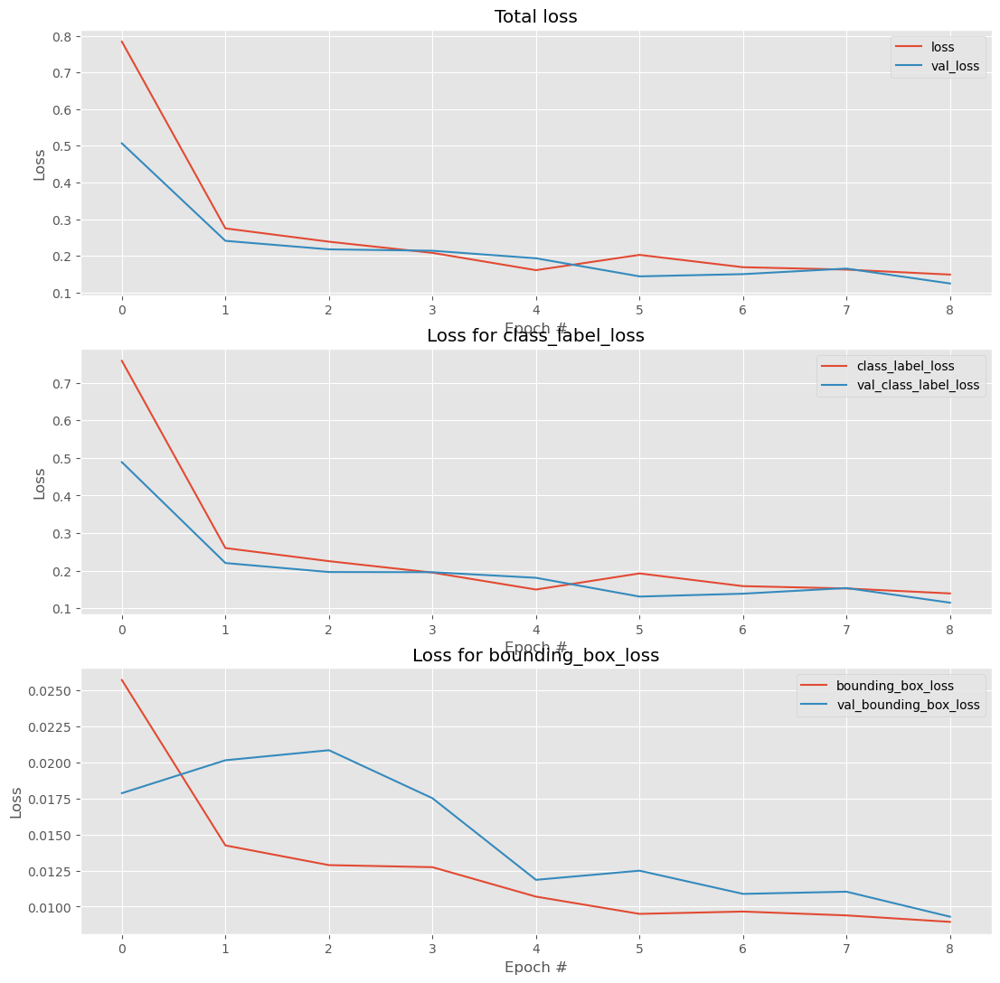

In [23]:
# plot the total loss, label loss, and bounding box loss
lossNames = ["loss", "class_label_loss", "bounding_box_loss"]
N = np.arange(0, 9)
plt.style.use("ggplot")
(fig, ax) = plt.subplots(3, 1, figsize=(13, 13))
# loop over the loss names
for (i, l) in enumerate(lossNames):
	# plot the loss for both the training and validation data
	title = "Loss for {}".format(l) if l != "loss" else "Total loss"
	ax[i].set_title(title)
	ax[i].set_xlabel("Epoch #")
	ax[i].set_ylabel("Loss")
	ax[i].plot(N, H.history[l], label=l)
	ax[i].plot(N, H.history["val_" + l], label="val_" + l)
	ax[i].legend()

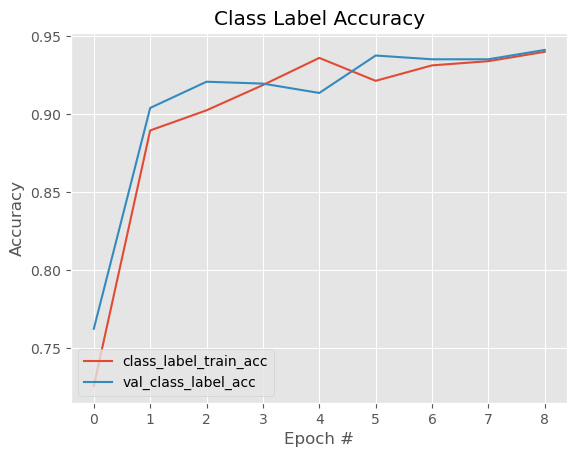

In [24]:
# create a new figure for the accuracies
plt.style.use("ggplot")
plt.figure()
plt.plot(N, H.history["class_label_accuracy"],
	label="class_label_train_acc")
plt.plot(N, H.history["val_class_label_accuracy"],
	label="val_class_label_acc")
plt.title("Class Label Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower left")

# PREDICTION

In [25]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
import numpy as np
import mimetypes
import argparse
import imutils
import pickle
import cv2
import os

In [26]:
# load our object detector and label binarizer from disk
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)
lb = pickle.loads(open(LB_PATH, "rb").read())

[INFO] loading object detector...


In [37]:
files = sorted(os.listdir("/kaggle/input/samplepesu/Test_data_images"), key=lambda x: int(x.split('.')[0]))
print(files)


['1.jpeg', '2.jpeg', '3.jpeg', '4.jpeg', '5.jpeg', '6.jpeg', '7.jpeg', '8.jpeg', '9.jpeg', '10.jpeg', '11.jpeg', '12.jpeg', '13.jpeg', '14.jpeg', '15.jpeg', '16.jpeg', '17.jpeg', '18.jpeg', '19.jpeg', '20.jpeg', '21.jpeg', '22.jpeg', '23.jpeg', '24.jpeg', '25.jpeg', '26.jpeg', '27.jpeg', '28.jpeg', '29.jpeg', '30.jpeg', '31.jpeg', '32.jpeg', '33.jpeg', '34.jpeg', '35.jpeg', '36.jpeg', '37.jpeg', '38.jpeg', '39.jpeg', '40.jpeg', '41.jpeg', '42.jpeg', '43.jpeg', '44.jpeg', '45.jpeg', '46.jpeg', '47.jpeg', '48.jpeg', '49.jpeg', '50.jpeg', '51.jpeg', '52.jpeg', '53.jpeg', '54.jpeg', '55.jpeg', '56.jpeg', '57.jpeg', '58.jpeg', '59.jpeg', '60.jpeg', '61.jpeg', '62.jpeg', '63.jpeg', '64.jpeg', '65.jpeg', '66.jpeg', '67.jpeg', '68.jpeg', '69.jpeg', '70.jpeg', '71.jpeg', '72.jpeg', '73.jpeg', '74.jpeg', '75.jpeg', '76.jpeg', '77.jpeg', '78.jpeg', '79.jpeg', '80.jpeg', '81.jpeg', '82.jpeg', '83.jpeg', '84.jpeg', '85.jpeg', '86.jpeg', '87.jpeg', '88.jpeg', '89.jpeg', '90.jpeg', '91.jpeg', '92.jpe

1/1 [==============================] - 0s 26ms/step


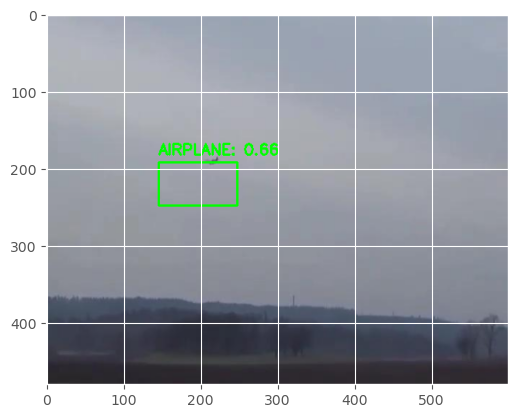

1/1 [==============================] - 0s 22ms/step


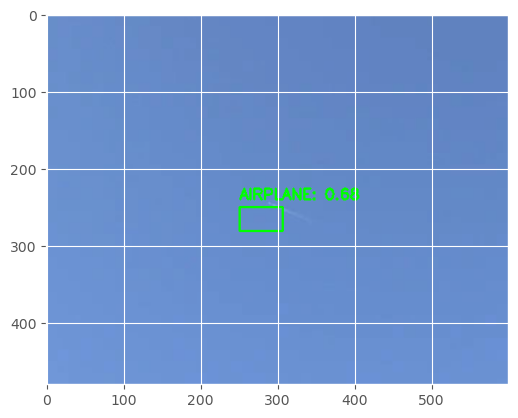

1/1 [==============================] - 0s 23ms/step


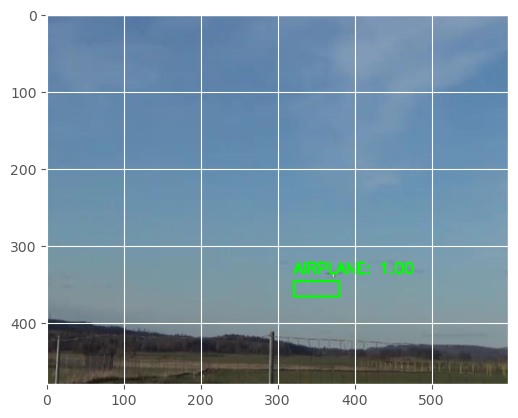

1/1 [==============================] - 0s 33ms/step


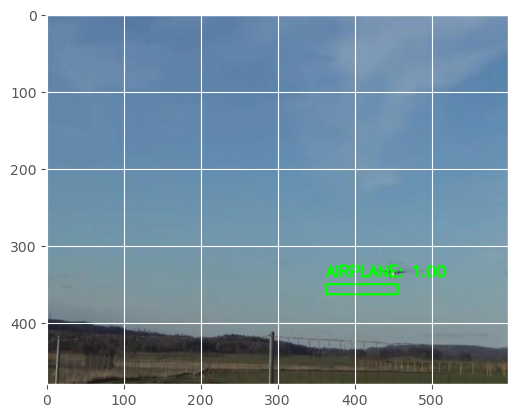

1/1 [==============================] - 0s 32ms/step


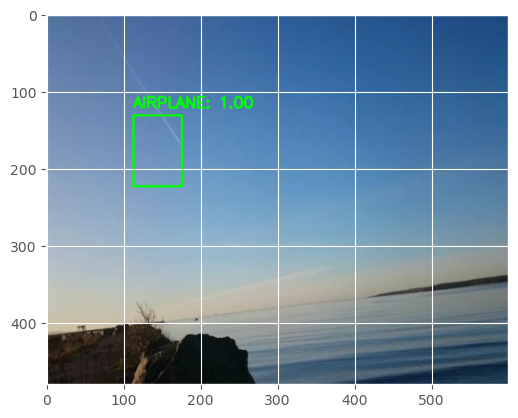

1/1 [==============================] - 0s 30ms/step


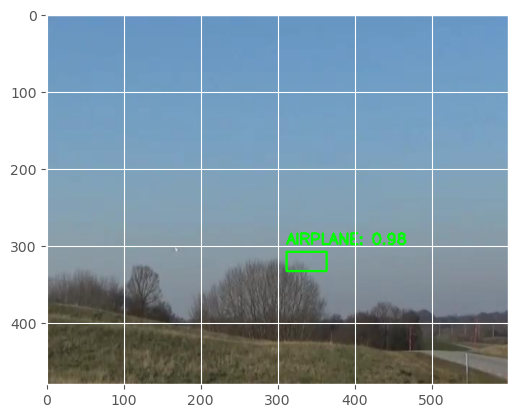

1/1 [==============================] - 0s 24ms/step


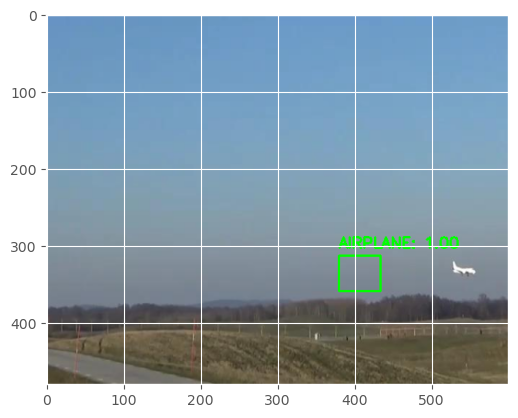

1/1 [==============================] - 0s 22ms/step


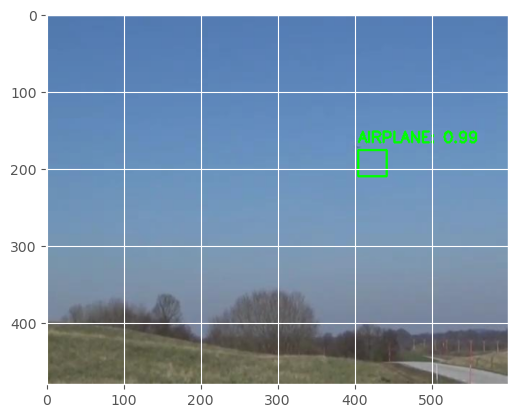

1/1 [==============================] - 0s 22ms/step


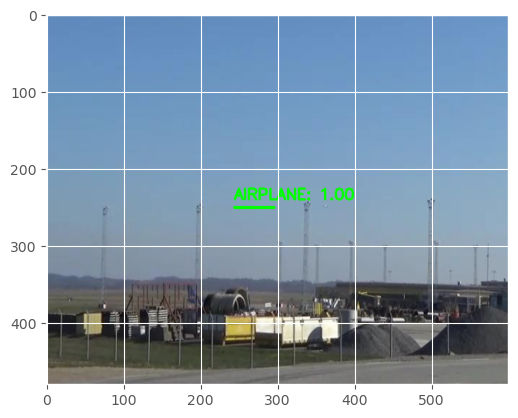

1/1 [==============================] - 0s 21ms/step


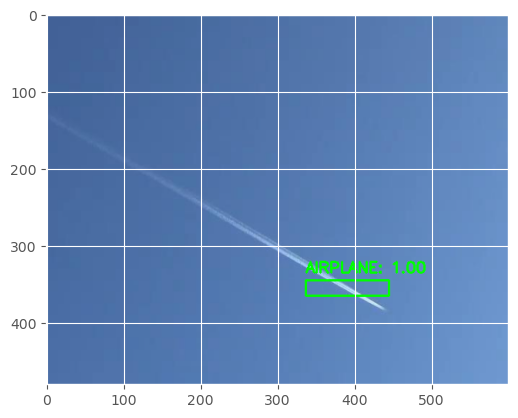

1/1 [==============================] - 0s 21ms/step


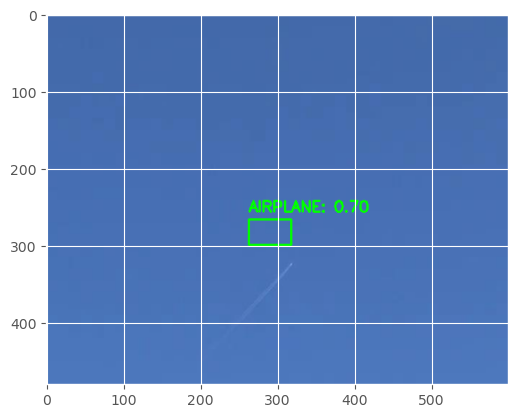

1/1 [==============================] - 0s 21ms/step


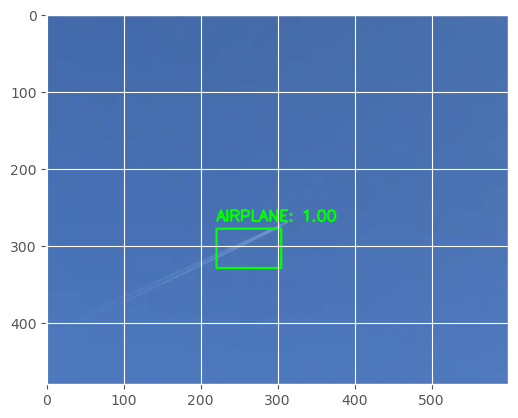

1/1 [==============================] - 0s 21ms/step


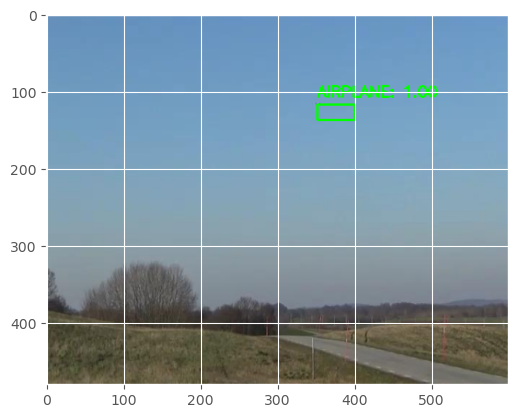

1/1 [==============================] - 0s 20ms/step


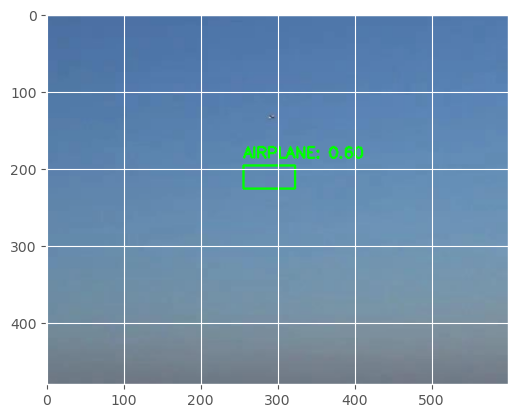

1/1 [==============================] - 0s 21ms/step


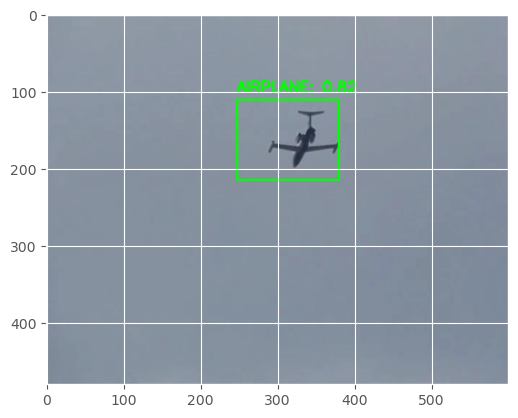

1/1 [==============================] - 0s 20ms/step


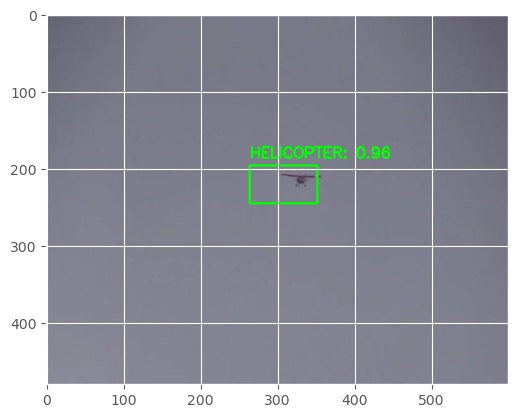

1/1 [==============================] - 0s 20ms/step


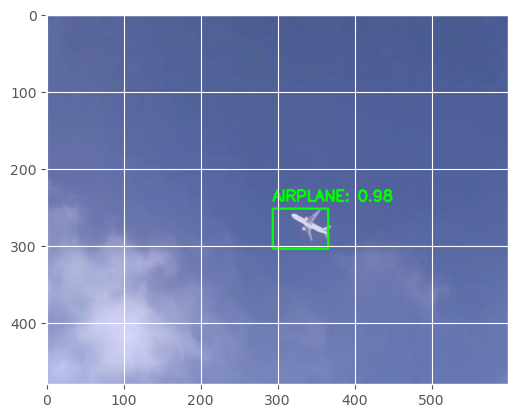

1/1 [==============================] - 0s 21ms/step


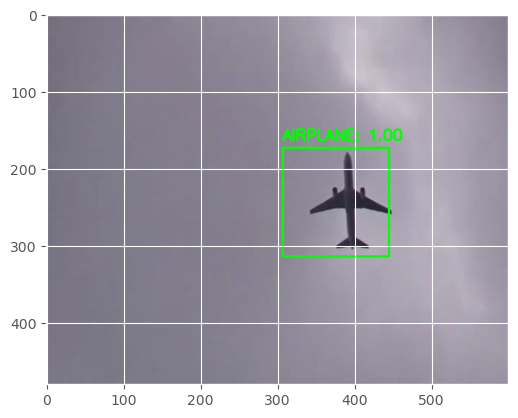

1/1 [==============================] - 0s 20ms/step


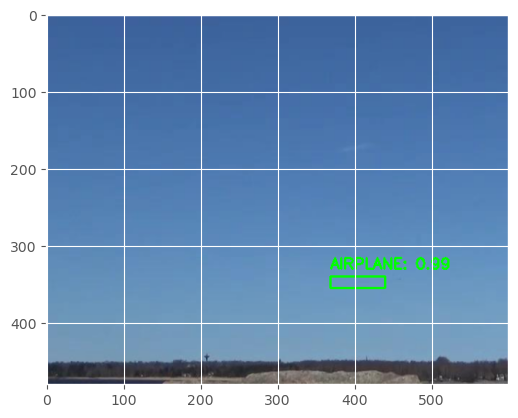

1/1 [==============================] - 0s 21ms/step


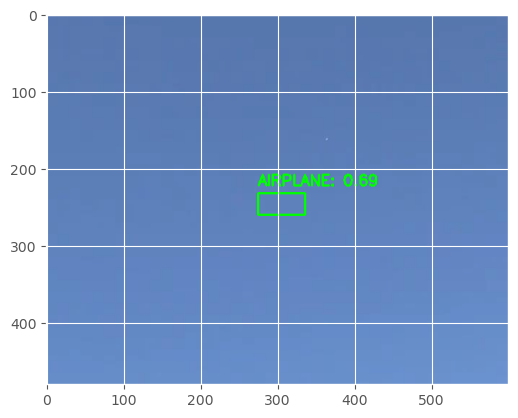

1/1 [==============================] - 0s 20ms/step


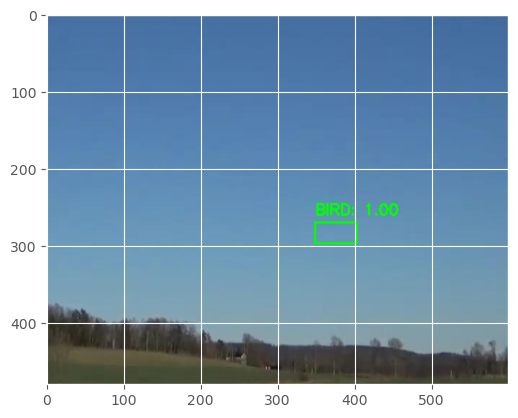

1/1 [==============================] - 0s 20ms/step


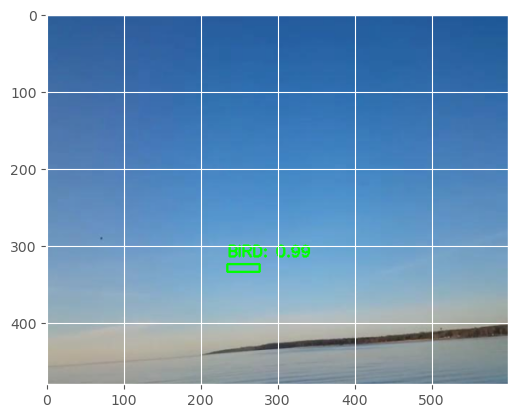

1/1 [==============================] - 0s 21ms/step


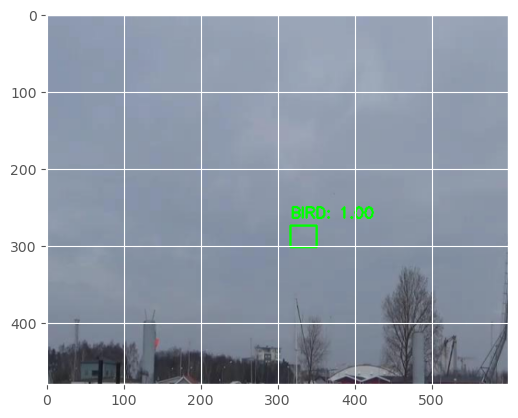

1/1 [==============================] - 0s 22ms/step


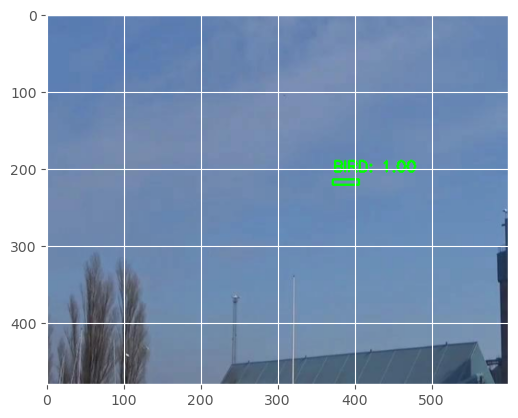

1/1 [==============================] - 0s 22ms/step


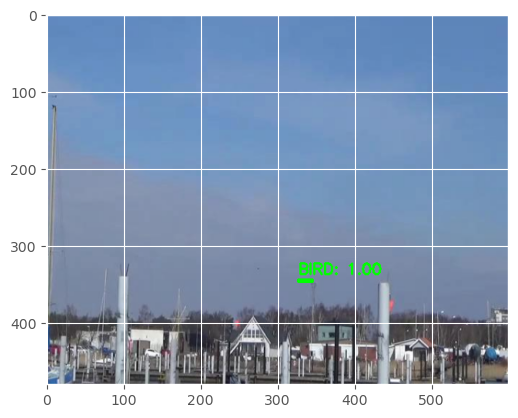

1/1 [==============================] - 0s 20ms/step


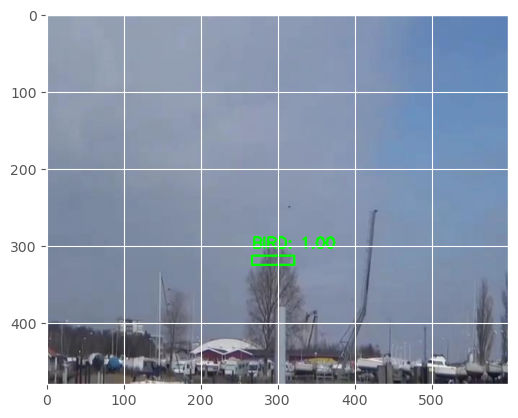

1/1 [==============================] - 0s 20ms/step


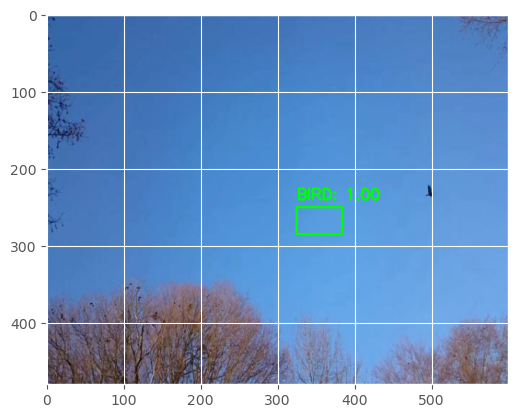

1/1 [==============================] - 0s 21ms/step


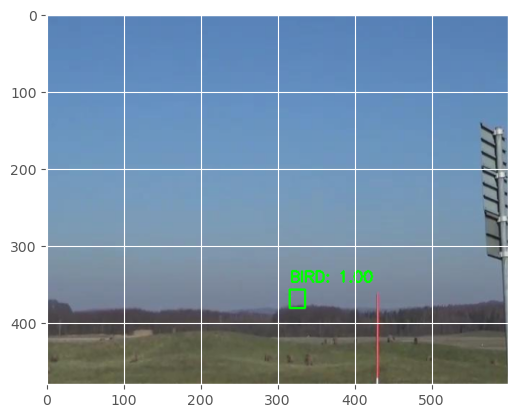

1/1 [==============================] - 0s 20ms/step


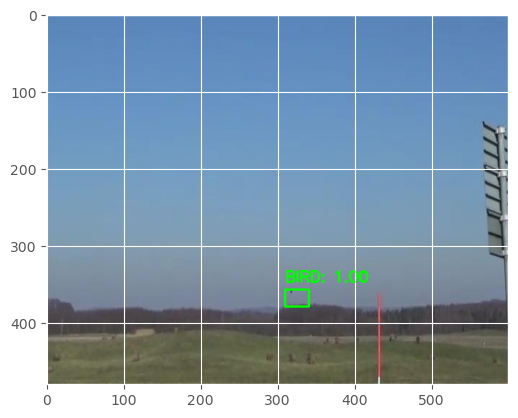

1/1 [==============================] - 0s 21ms/step


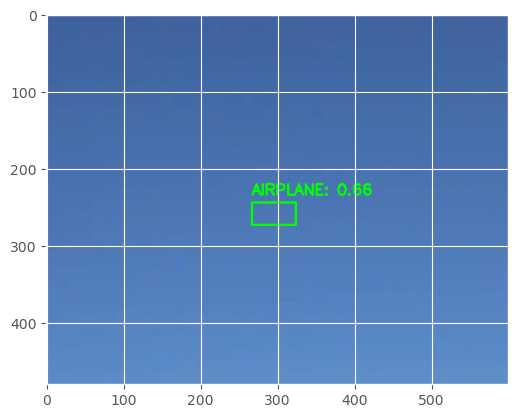

1/1 [==============================] - 0s 20ms/step


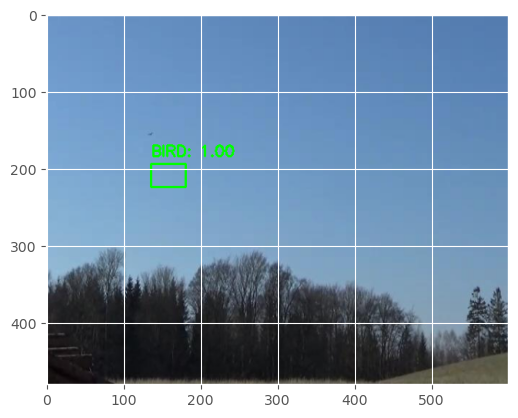

1/1 [==============================] - 0s 22ms/step


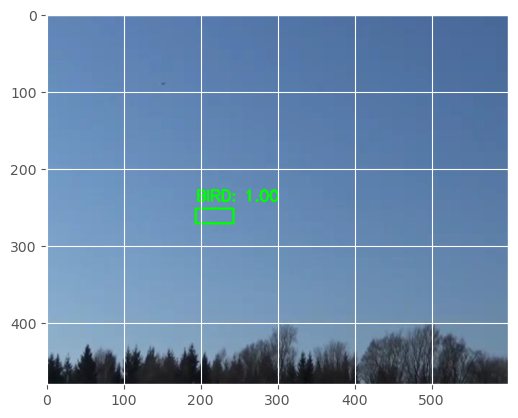

1/1 [==============================] - 0s 21ms/step


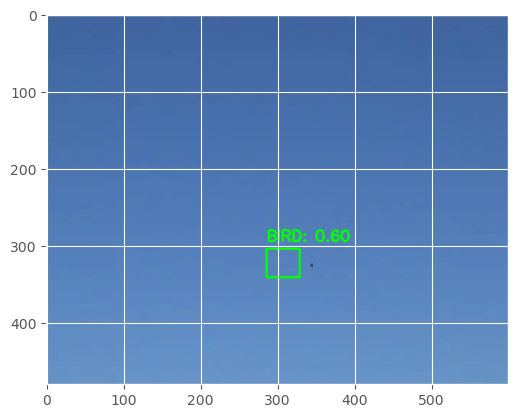

1/1 [==============================] - 0s 22ms/step


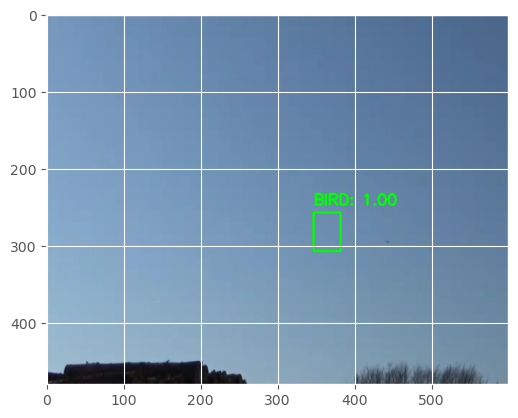

1/1 [==============================] - 0s 23ms/step


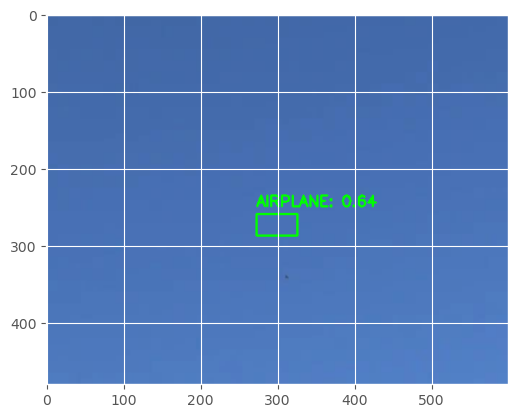

1/1 [==============================] - 0s 21ms/step


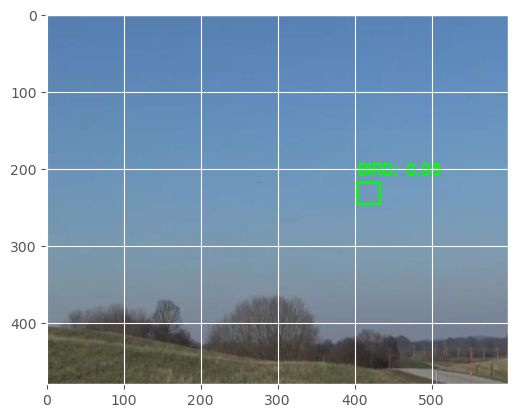

1/1 [==============================] - 0s 21ms/step


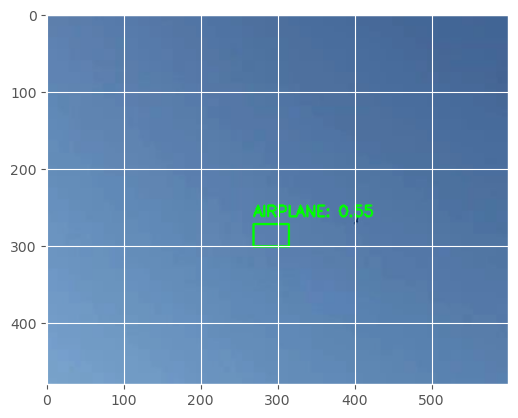

1/1 [==============================] - 0s 20ms/step


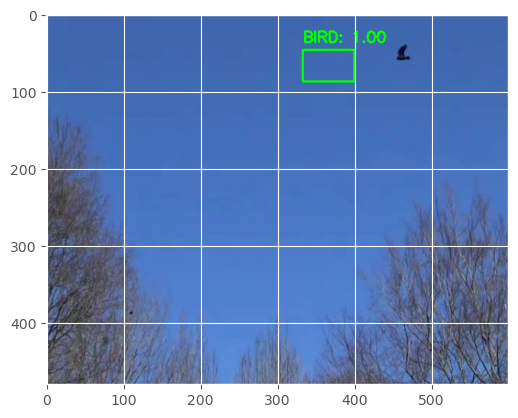

1/1 [==============================] - 0s 22ms/step


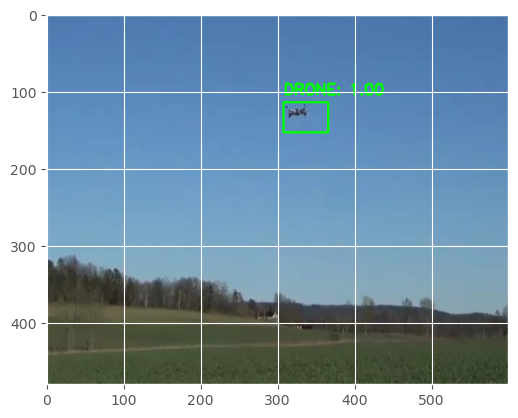

1/1 [==============================] - 0s 21ms/step


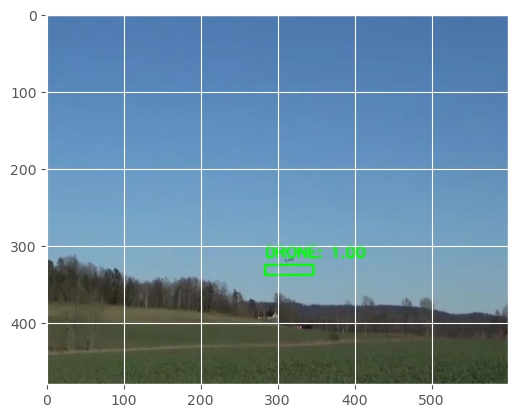

1/1 [==============================] - 0s 20ms/step


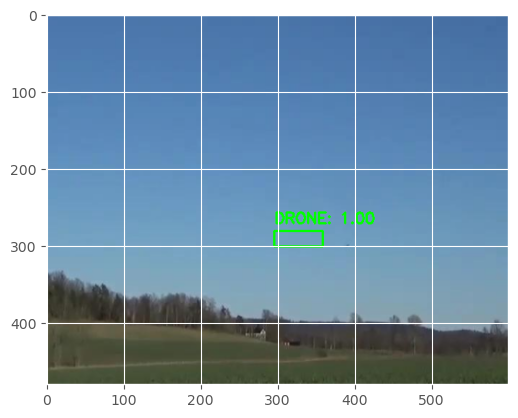

1/1 [==============================] - 0s 22ms/step


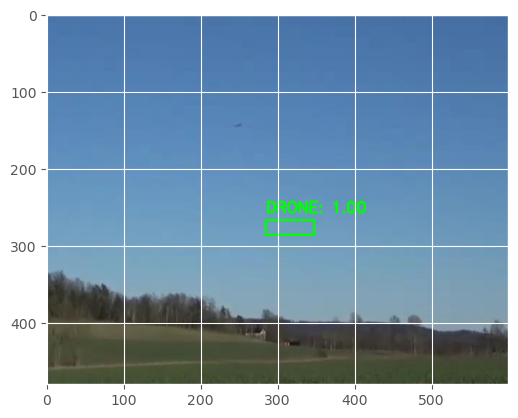

1/1 [==============================] - 0s 20ms/step


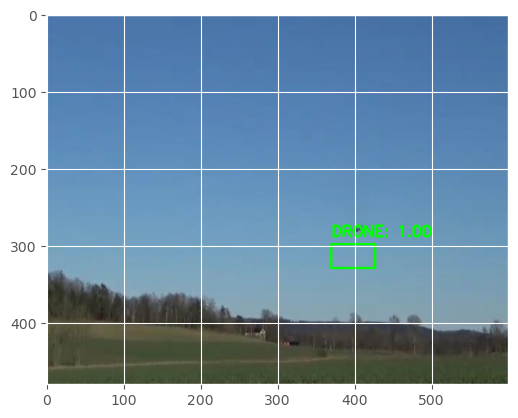

1/1 [==============================] - 0s 21ms/step


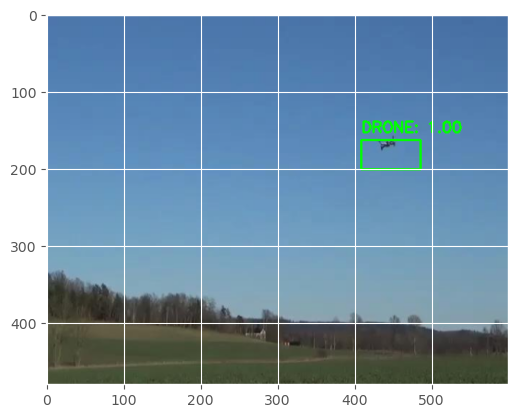

1/1 [==============================] - 0s 21ms/step


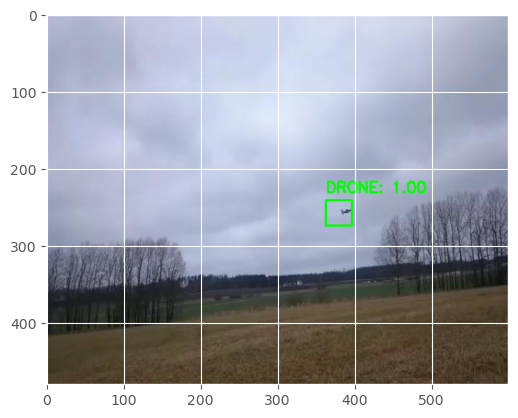

1/1 [==============================] - 0s 21ms/step


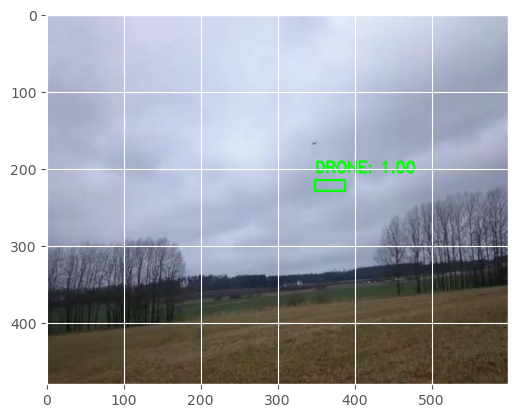

1/1 [==============================] - 0s 21ms/step


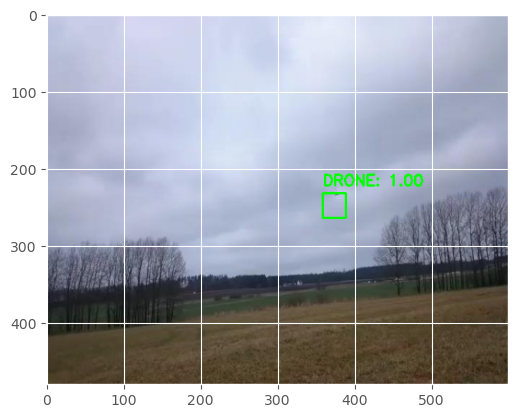

1/1 [==============================] - 0s 21ms/step


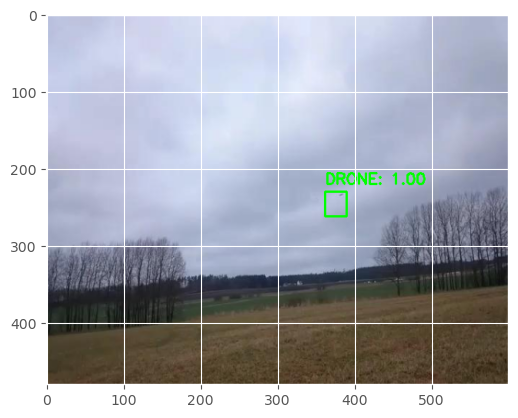

1/1 [==============================] - 0s 21ms/step


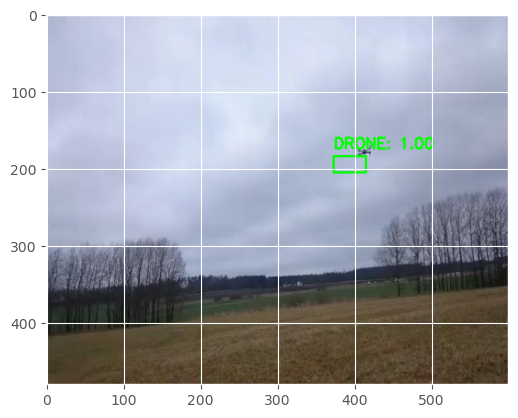

1/1 [==============================] - 0s 21ms/step


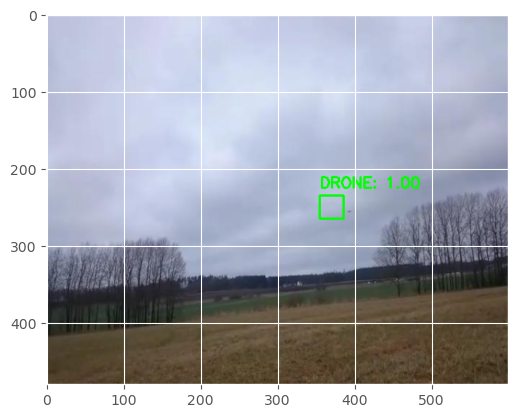

1/1 [==============================] - 0s 20ms/step


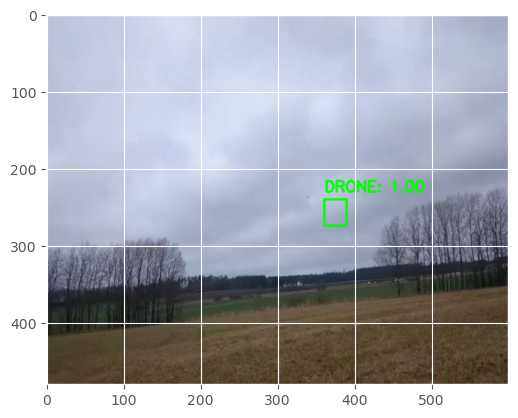

1/1 [==============================] - 0s 22ms/step


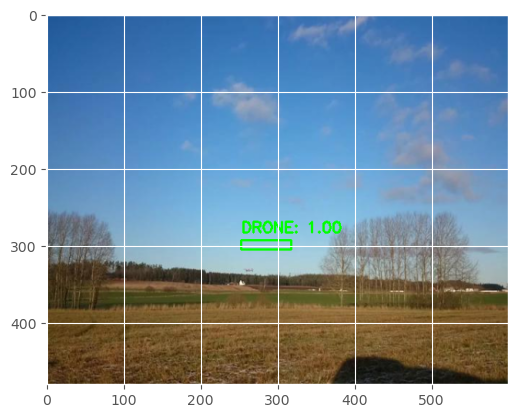

1/1 [==============================] - 0s 21ms/step


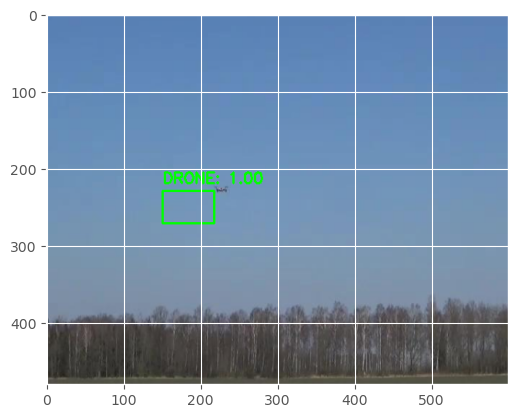

1/1 [==============================] - 0s 21ms/step


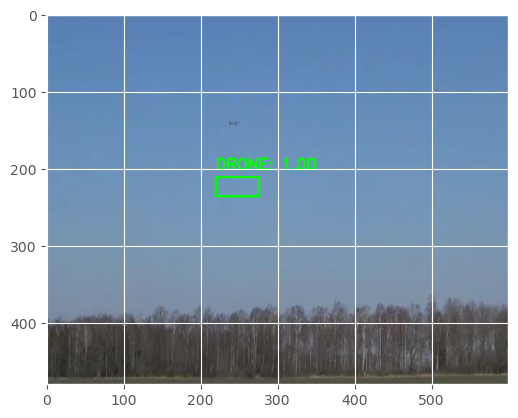

1/1 [==============================] - 0s 20ms/step


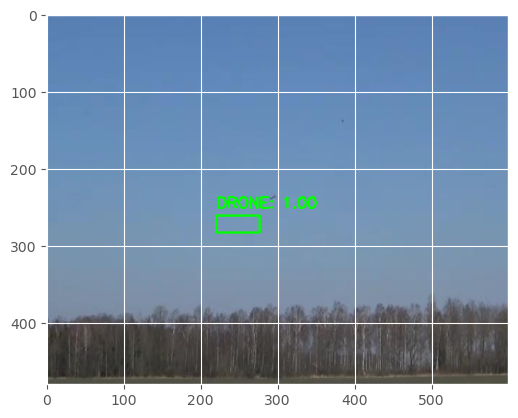

1/1 [==============================] - 0s 23ms/step


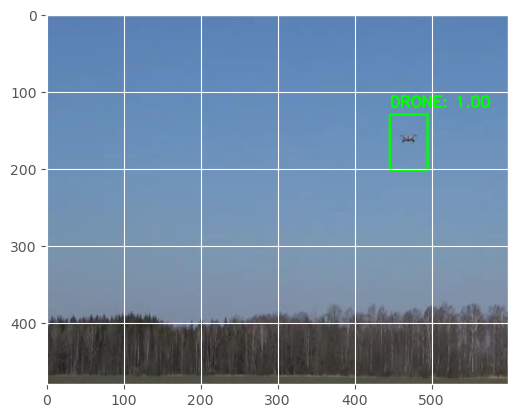

1/1 [==============================] - 0s 25ms/step


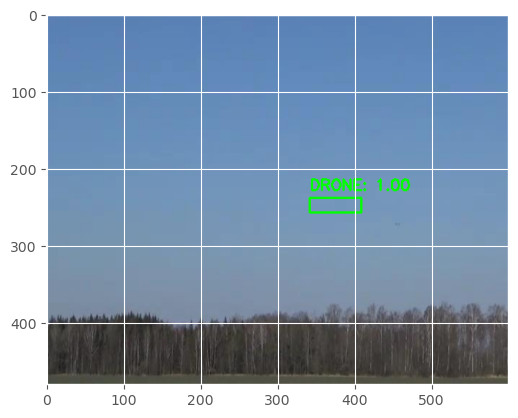

1/1 [==============================] - 0s 24ms/step


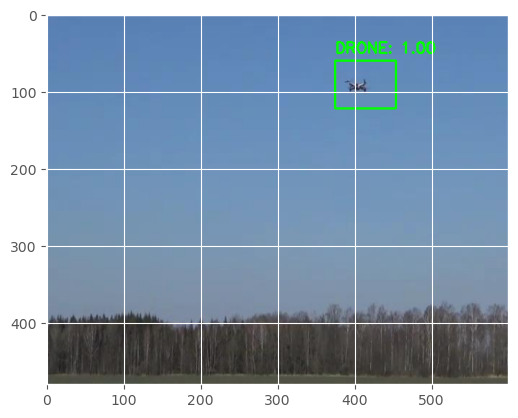

1/1 [==============================] - 0s 22ms/step


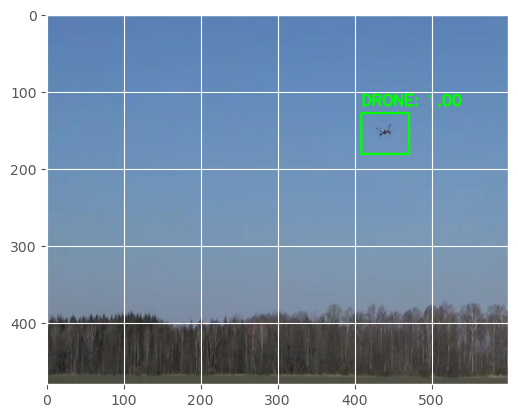

1/1 [==============================] - 0s 24ms/step


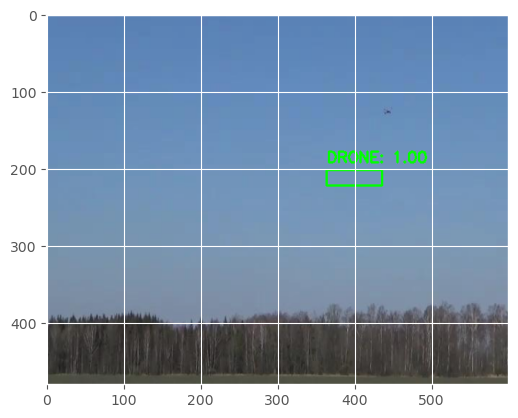

1/1 [==============================] - 0s 23ms/step


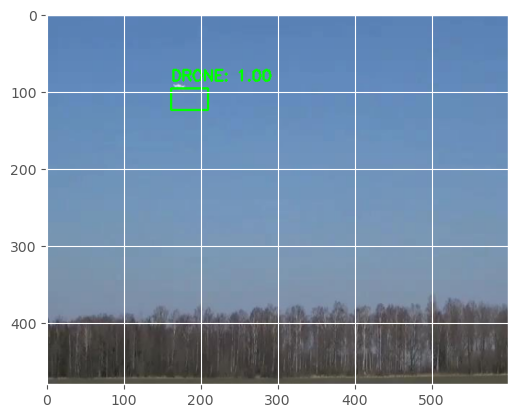

1/1 [==============================] - 0s 21ms/step


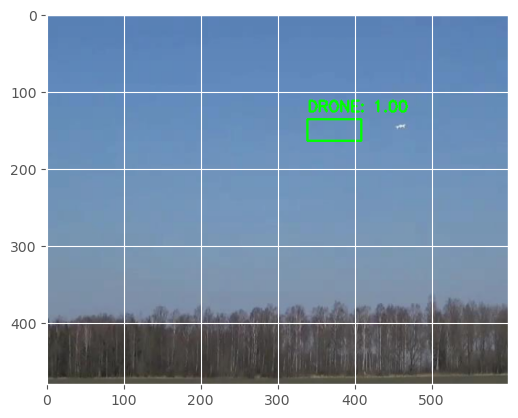

1/1 [==============================] - 0s 25ms/step


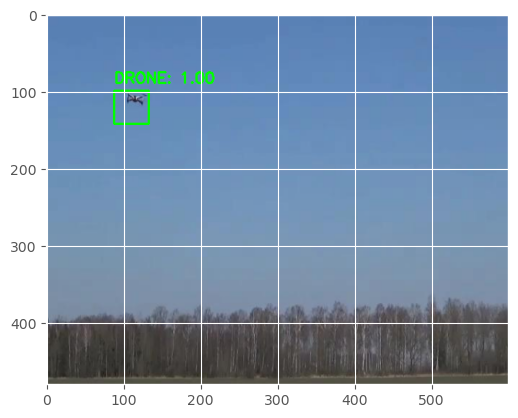

1/1 [==============================] - 0s 23ms/step


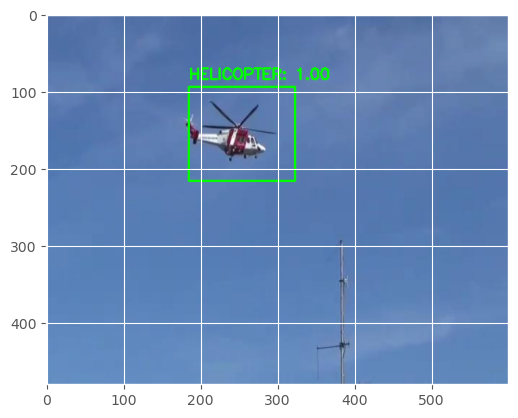

1/1 [==============================] - 0s 22ms/step


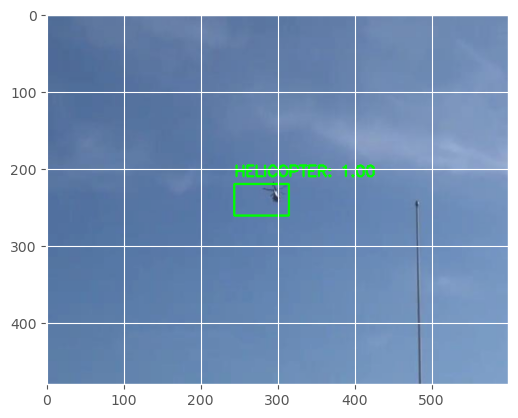

1/1 [==============================] - 0s 22ms/step


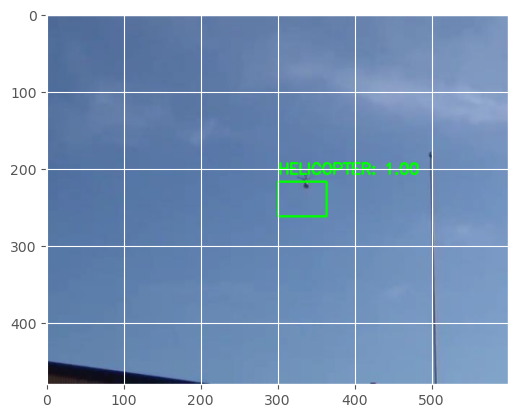

1/1 [==============================] - 0s 21ms/step


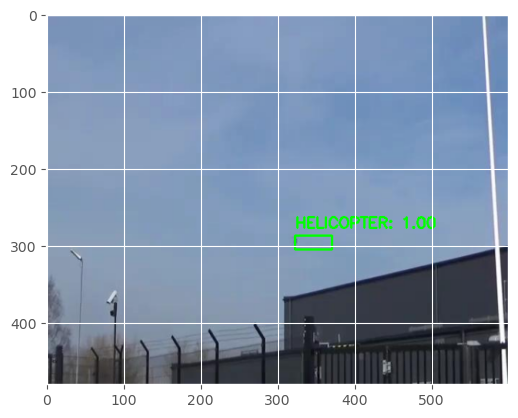

1/1 [==============================] - 0s 21ms/step


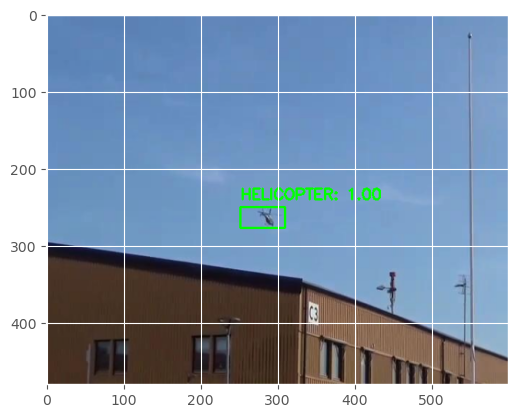

1/1 [==============================] - 0s 21ms/step


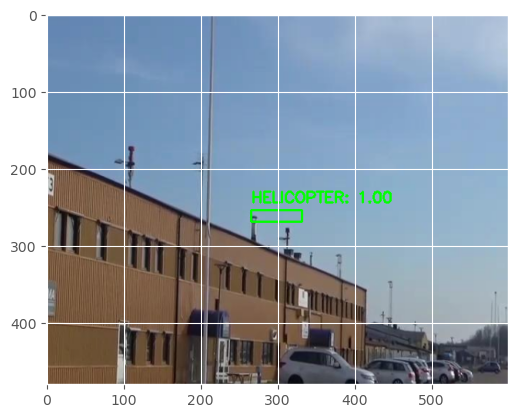

1/1 [==============================] - 0s 21ms/step


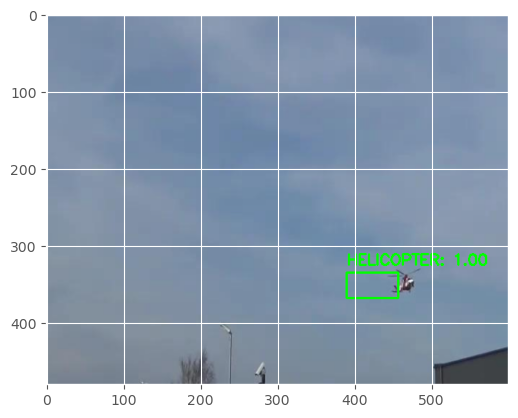

1/1 [==============================] - 0s 21ms/step


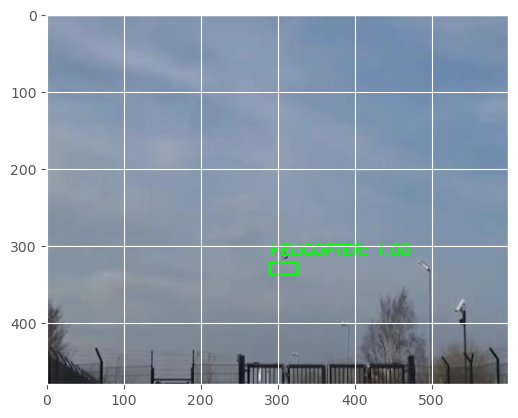

1/1 [==============================] - 0s 24ms/step


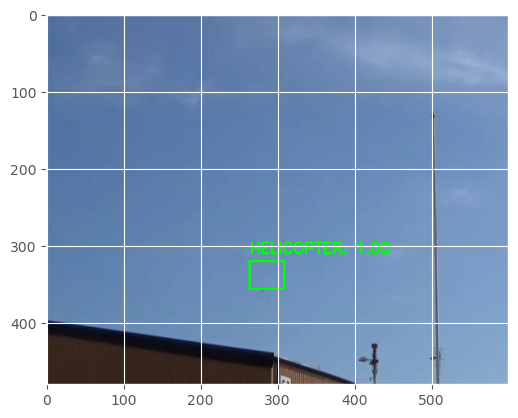

1/1 [==============================] - 0s 22ms/step


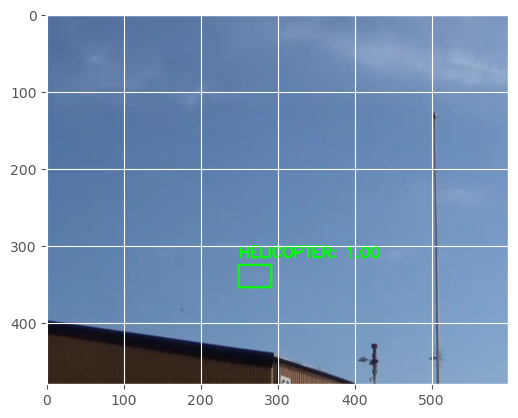

1/1 [==============================] - 0s 24ms/step


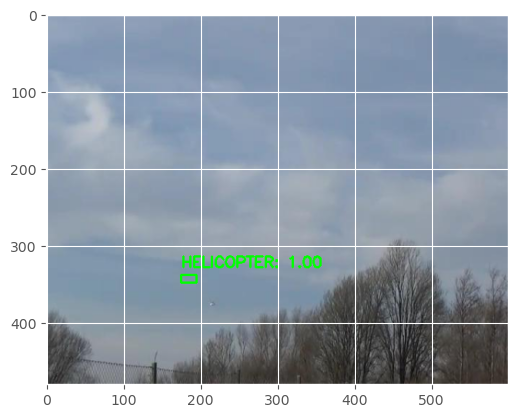

1/1 [==============================] - 0s 24ms/step


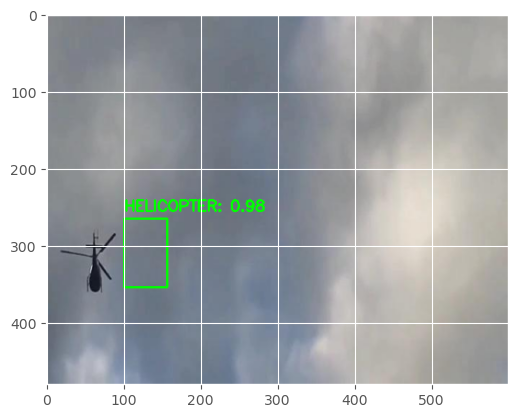

1/1 [==============================] - 0s 23ms/step


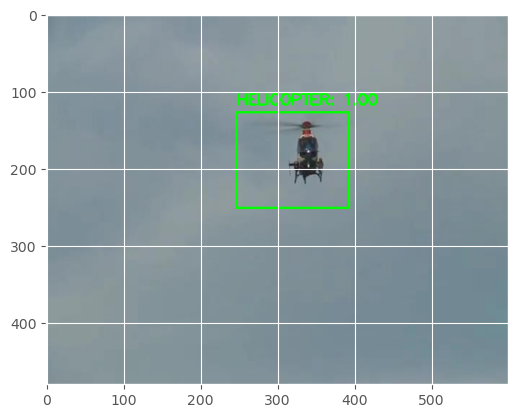

1/1 [==============================] - 0s 24ms/step


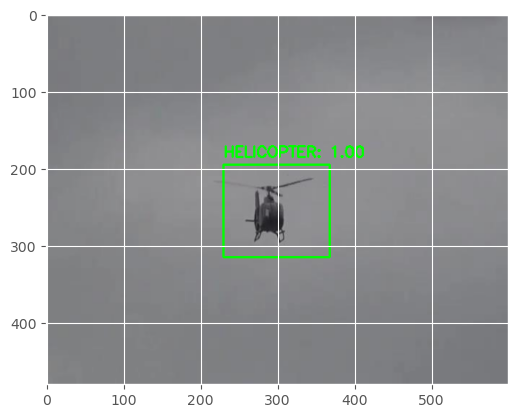

1/1 [==============================] - 0s 22ms/step


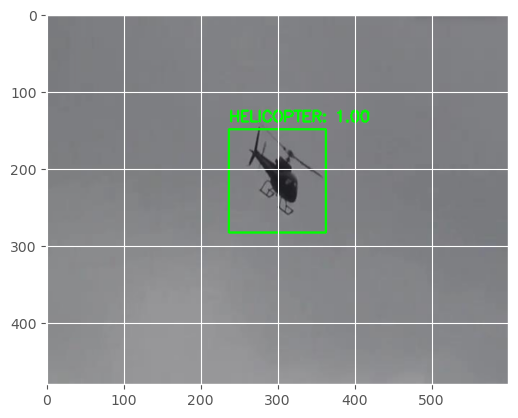

1/1 [==============================] - 0s 21ms/step


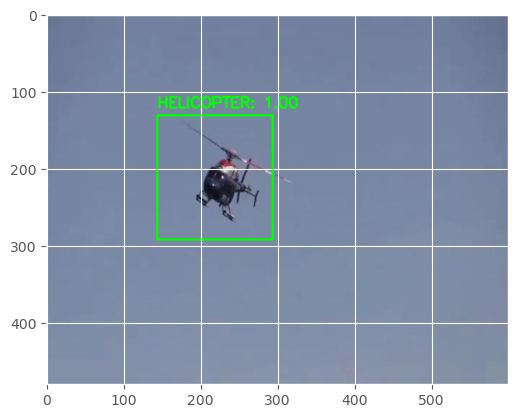

1/1 [==============================] - 0s 21ms/step


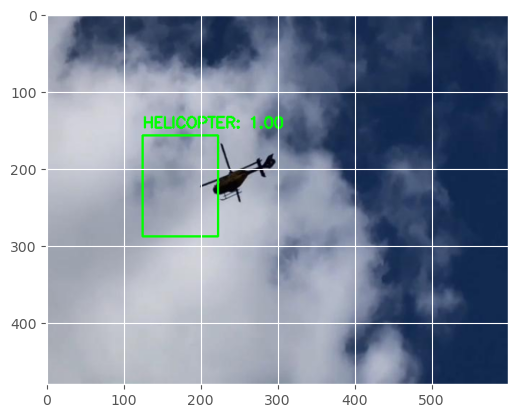

1/1 [==============================] - 0s 23ms/step


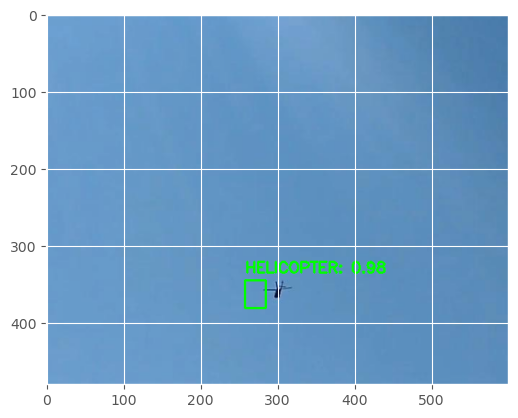

1/1 [==============================] - 0s 21ms/step


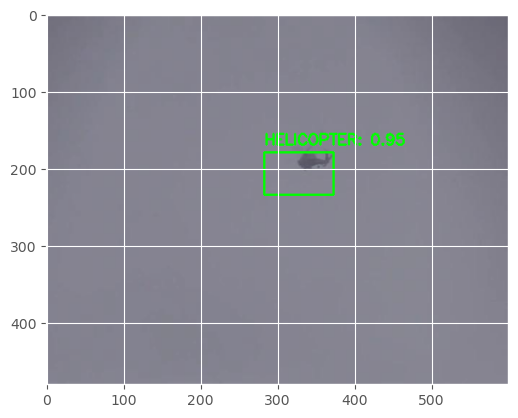

1/1 [==============================] - 0s 21ms/step


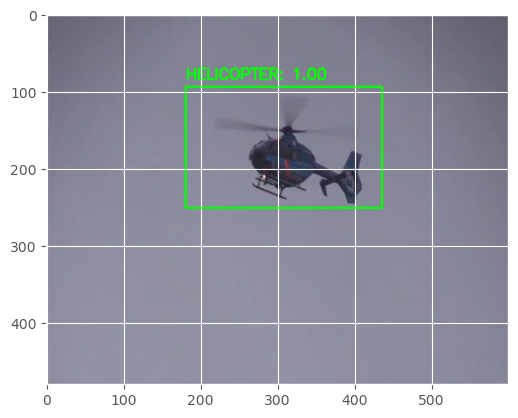

1/1 [==============================] - 0s 21ms/step


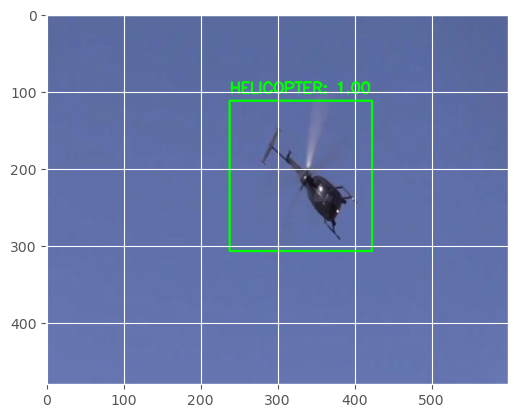

1/1 [==============================] - 0s 22ms/step


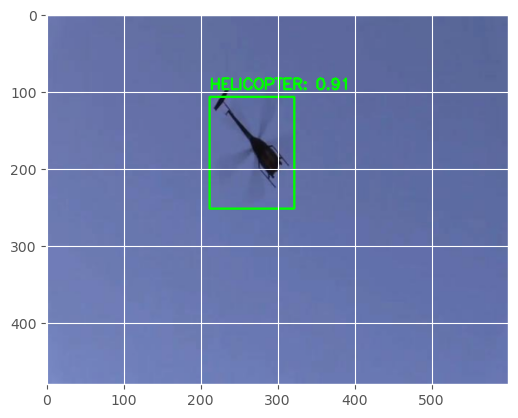

1/1 [==============================] - 0s 22ms/step


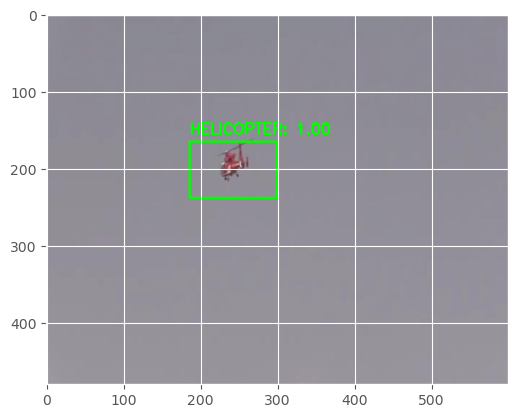

1/1 [==============================] - 0s 20ms/step


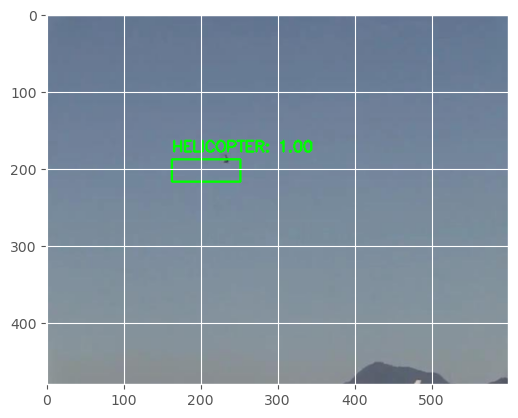

1/1 [==============================] - 0s 21ms/step


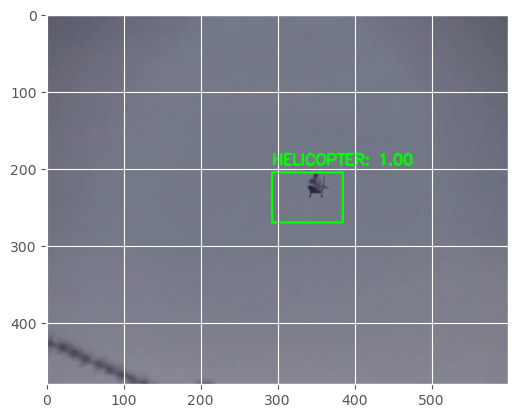

1/1 [==============================] - 0s 21ms/step


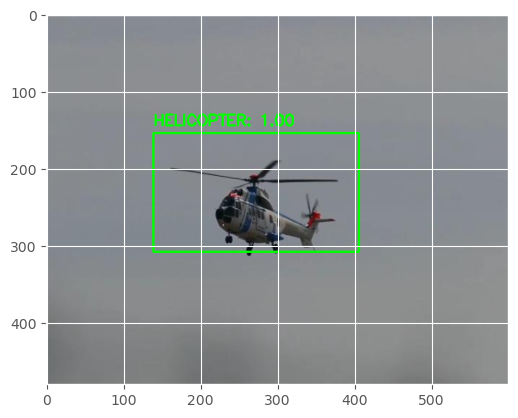

1/1 [==============================] - 0s 20ms/step


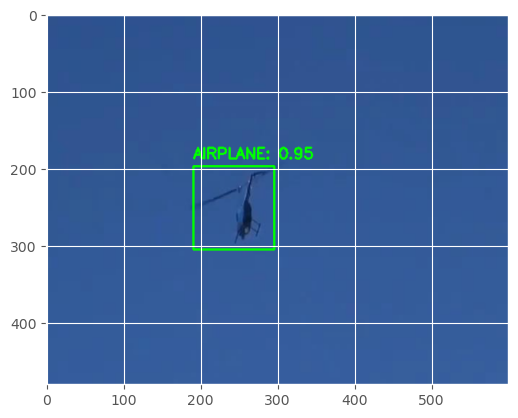

1/1 [==============================] - 0s 23ms/step


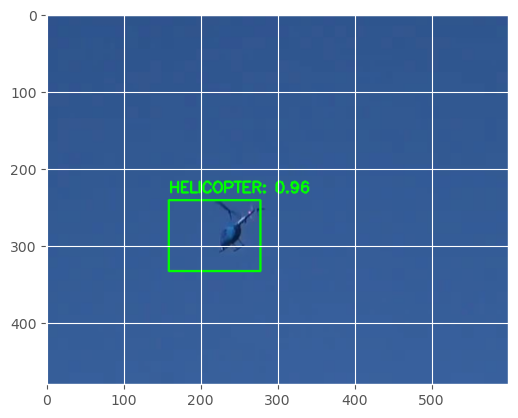

1/1 [==============================] - 0s 21ms/step


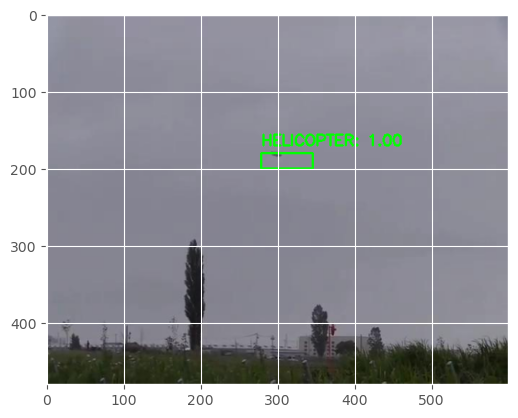

1/1 [==============================] - 0s 22ms/step


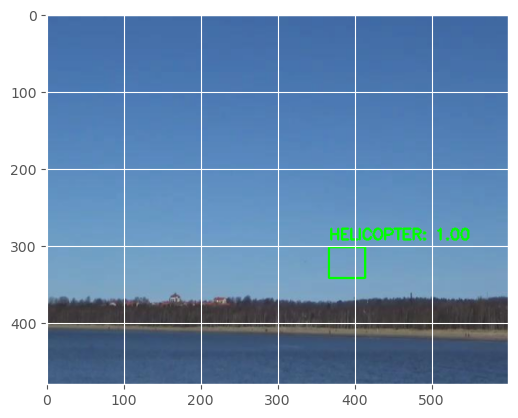

1/1 [==============================] - 0s 24ms/step


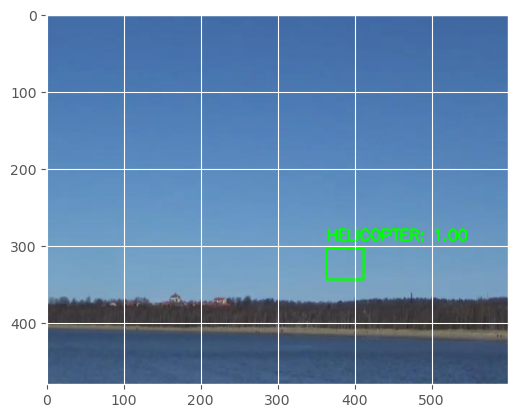

1/1 [==============================] - 0s 22ms/step


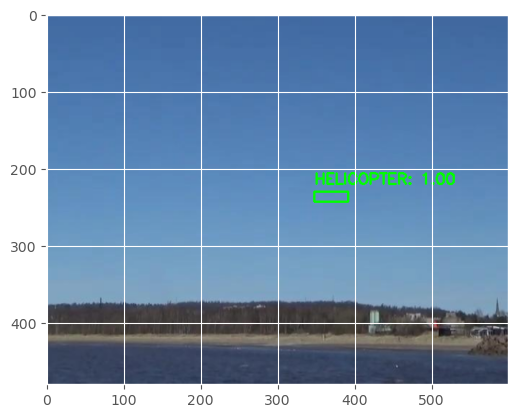

1/1 [==============================] - 0s 21ms/step


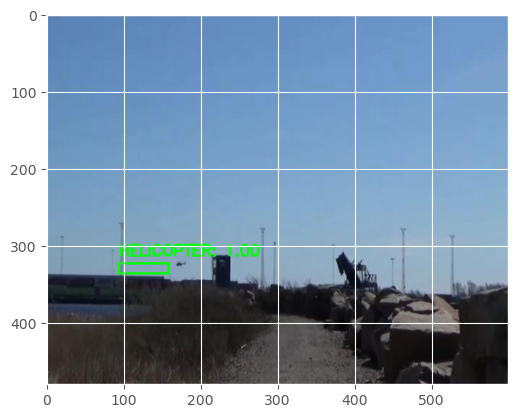

In [40]:
import csv

# create a list to store the predictions
predictions = []

l = {'AIRPLANE':'0', 'BIRD':'1', 'DRONE':'2', 'HELICOPTER':'3'}

# loop over the images that we'll be testing using our bounding box
# regression model
for imagePath in files:
    if imagePath.split('.')[0] not in ['23', '27', '29', '67']:
        # load the input image (in Keras format) from disk and preprocess
        # it, scaling the pixel intensities to the range [0, 1]
        image = load_img("/kaggle/input/samplepesu/Test_data_images/"+imagePath, target_size=(224, 224))
        image = img_to_array(image) / 255.0
        image = np.expand_dims(image, axis=0)

        # predict the bounding box of the object along with the class
        # label
        (boxPreds, labelPreds) = model.predict(image)
        (startX, startY, endX, endY) = boxPreds[0]
        i = np.argmax(labelPreds, axis=1)
        label = lb.classes_[i][0]
        confidence = float(labelPreds[0][i])
    
        # load the input image (in OpenCV format), resize it such that it
        # fits on our screen, and grab its dimensions
        image = cv2.imread("/kaggle/input/samplepesu/Test_data_images/"+imagePath)
        image = imutils.resize(image, width=600)
        (h, w) = image.shape[:2]

        # scale the predicted bounding box coordinates based on the image
        # dimensions
        startX = int(startX * w)
        startY = int(startY * h)
        endX = int(endX * w)
        endY = int(endY * h)
        
          # add the prediction to the list
        predictions.append({
            'Test Image': imagePath,
            'Prediction string': "{" + f'{l[label]} {confidence:.2f} {startX} {startY} {endX-startX} {endY-startY}' + "}"
        })

        # draw the predicted bounding box and class label on the image
        y = startY - 10 if startY - 10 > 10 else startY + 10
        cv2.putText(image, "{}: {:.2f}".format(label, confidence), (startX, y), cv2.FONT_HERSHEY_SIMPLEX,0.65, (0, 255, 0), 2)
        cv2.rectangle(image, (startX, startY), (endX, endY),(0, 255, 0), 2)

        # show the output image
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.show()

# write the predictions to a CSV file
with open('predictions.csv', mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Test Image', 'Prediction string'])
    writer.writeheader()
    writer.writerows(predictions)


In [41]:
df = pd.read_csv('/kaggle/working/predictions.csv')
df.head()

,Test Image,Prediction string
0,1.jpeg,{0 0.66 146 192 102 56}
1,2.jpeg,{0 0.68 251 250 56 31}
2,3.jpeg,{0 1.00 322 346 59 20}
3,4.jpeg,{0 1.00 364 350 93 13}
4,5.jpeg,{0 1.00 113 131 63 92}


In [ ]:
all